In [138]:
%matplotlib inline
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from geopy.distance import great_circle
from matplotlib.colors import Normalize, LinearSegmentedColormap
from matplotlib.collections import PatchCollection
from shapely.geometry import Point, Polygon, MultiPoint, MultiPolygon
from shapely.prepared import prep
from pysal.esda.mapclassify import Natural_Breaks as nb
from descartes import PolygonPatch
import os
import mplleaflet
from itertools import chain

In [4]:
# Convenience functions for working with colour ramps and bars
def colorbar_index(ncolors, cmap, labels=None, **kwargs):
    """
    This is a convenience function to stop you making off-by-one errors
    Takes a standard colour ramp, and discretizes it,
    then draws a colour bar with correctly aligned labels
    """
    cmap = cmap_discretize(cmap, ncolors)
    mappable = cm.ScalarMappable(cmap=cmap)
    mappable.set_array([])
    mappable.set_clim(-0.5, ncolors+0.5)
    colorbar = plt.colorbar(mappable, **kwargs)
    colorbar.set_ticks(np.linspace(0, ncolors, ncolors))
    colorbar.set_ticklabels(range(ncolors))
    if labels:
        colorbar.set_ticklabels(labels)
    return colorbar

def cmap_discretize(cmap, N):
    """
    Return a discrete colormap from the continuous colormap cmap.

        cmap: colormap instance, eg. cm.jet. 
        N: number of colors.

    Example
        x = resize(arange(100), (5,100))
        djet = cmap_discretize(cm.jet, 5)
        imshow(x, cmap=djet)

    """
    if type(cmap) == str:
        cmap = get_cmap(cmap)
    colors_i = np.concatenate((np.linspace(0, 1., N), (0., 0., 0., 0.)))
    colors_rgba = cmap(colors_i)
    indices = np.linspace(0, 1., N + 1)
    cdict = {}
    for ki, key in enumerate(('red', 'green', 'blue')):
        cdict[key] = [(indices[i], colors_rgba[i - 1, ki], colors_rgba[i, ki]) for i in xrange(N + 1)]
    return LinearSegmentedColormap(cmap.name + "_%d" % N, cdict, 1024)

In [198]:
crimes = pd.DataFrame()

mypath = './metropolitan_all'
for (dirpath, dirnames, filenames) in os.walk(mypath):
    if dirpath is not './metropolitan_all':
        for filename in filenames:
            if 'csv' in filename and '2015' in filename:
                frame = pd.read_csv(dirpath + '/' + filename)
                crimes = crimes.append(frame, ignore_index=True)
# frame = pd.read_csv('./metropolitan_all/2015-08/2015-08-city-of-london-street.csv')
# crimes = crimes.append(frame, ignore_index=True)
# frame = pd.read_csv('./metropolitan_all/2015-08/2015-08-metropolitan-street.csv')
# crimes = crimes.append(frame, ignore_index=True)
len(crimes)

631378

In [197]:
crimes = crimes.dropna(axis=0, subset=['LSOA code'])
len(crimes)

45741

In [148]:
crimes = crimes[['Month','LSOA code',"Longitude","Latitude",'Crime type']]

In [174]:
lsoas = gpd.GeoDataFrame().from_file('./LSOA/LSOA_2011_EW_BGC_V2.shp')
lsoas = lsoas.to_crs(epsg=4326)
london_bounds = prep(Polygon([(-0.5, 51.3), (-0.5, 51.7), (0.3, 51.7), (0.3, 51.3)]))
lsoas_london = [lsoa for index, lsoa in lsoas.iterrows() if london_bounds.contains(lsoa.geometry)]
lsoas_london = gpd.GeoDataFrame(lsoas_london)
lsoas_london = lsoas_london.dropna(subset=['LSOA11CD'])
print(len(lsoas_london))

all_crimes = crimes

5331


In [189]:
def plot_crime_type(crimes, lsoas_london):
    crime_count = crimes.loc[:,('LSOA code')].value_counts()
    lsoas_london = lsoas_london.join(crime_count, on='LSOA11CD')
    lsoas_london['crime_count'] = lsoas_london['LSOA code']
    lsoas_london = lsoas_london.drop('LSOA code', axis=1)

    lsoas_london = gpd.GeoDataFrame(lsoas_london)
    lsoas_london.crs = lsoas.crs
    lsoas_london['density_km'] = lsoas_london['crime_count'] / (lsoas_london.to_crs(epsg=32630).area/10**6)
    # it's easier to work with NaN values when classifying
    lsoas_london.replace(to_replace={'density_km': {0: np.nan}}, inplace=True)

    breaks = nb(
        lsoas_london[lsoas_london['density_km'].notnull()].density_km.values,
        initial=300,
        k=5)
    # the notnull method lets us match indices when joining
    jb = pd.DataFrame({'jenks_bins': breaks.yb}, index=lsoas_london[lsoas_london['density_km'].notnull()].index)
    lsoas_london.drop(['jenks_bins'],axis=1,inplace=True, errors='ignore')
    lsoas_london = lsoas_london.join(jb)
    lsoas_london.jenks_bins.fillna(-1, inplace=True)

    jenks_labels = ["<= %0.1f/km$^2$(%s LSOAs)" % (b, c) for b, c in zip(
        breaks.bins, breaks.counts)]
    jenks_labels.insert(0, 'No crimes (%s LSOAs)' % len(lsoas_london[lsoas_london['density_km'].isnull()]))

    #for some reason getting multipolygons from the data
    lsoas_london = lsoas_london.apply(lambda row: row if type(row.geometry) is Polygon else None, axis=1)
    lsoas_london = lsoas_london.dropna(subset=['LSOA11CD'])

    plt.clf()
    fig = plt.figure()
    ax = fig.add_subplot(111, axisbg='w', frame_on=False)

    # use a red colour ramp - we'll be converting it to a map using cmap()
    cmap = plt.get_cmap('Reds')
    # draw LSOAs with black outlines
    patches = gpd.GeoSeries(
        lsoas_london.geometry.map(lambda x: PolygonPatch(x, ec='#000000', lw=.2, alpha=1., zorder=9))
    )
    pc = PatchCollection(patches, match_original=True)
    # impose our colour map onto the patch collection
    norm = Normalize()
    pc.set_facecolor(cmap(norm(lsoas_london['jenks_bins'].values)))
    ax.add_collection(pc)

    ax.autoscale() 

    # Add a colour bar
    cb = colorbar_index(ncolors=len(jenks_labels), cmap=cmap, shrink=0.5, labels=jenks_labels)
    cb.ax.tick_params(labelsize=6)

    # this will set the image width to 722px at 100dpi
    plt.tight_layout()
    plt.title(crime_type)
    fig.set_size_inches(13, 7)
    plt.savefig('crime_figures/' + crime_type + '.png', dpi=300, alpha=True)
    plt.show()

    return ax

In [131]:
crime_types = list(crimes['Crime type'].drop_duplicates())

In [132]:
list(enumerate(crime_types))

[(0, 'Bicycle theft'),
 (1, 'Burglary'),
 (2, 'Other theft'),
 (3, 'Theft from the person'),
 (4, 'Anti-social behaviour'),
 (5, 'Public order'),
 (6, 'Shoplifting'),
 (7, 'Other crime'),
 (8, 'Drugs'),
 (9, 'Vehicle crime'),
 (10, 'Violence and sexual offences'),
 (11, 'Criminal damage and arson'),
 (12, 'Possession of weapons'),
 (13, 'Robbery')]

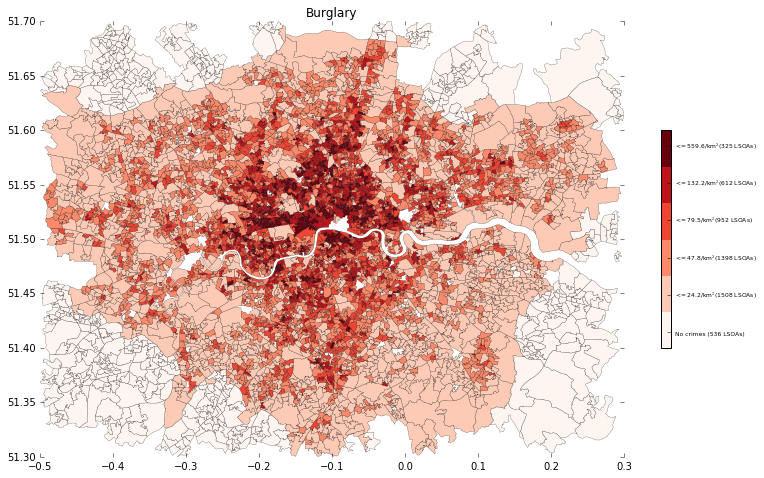

In [190]:
output_plots = {}
for crime_type in crime_types[1:2]:
    temp_crimes = all_crimes[all_crimes['Crime type'] == crime_type]
    output_plots[crime_type] = plot_crime_type(temp_crimes, lsoas_london)

In [126]:
mplleaflet.display(fig=output_plots['Anti-social behaviour'].figure, crs=lsoas.crs, tiles='cartodb_positron')

In [ ]:
all_crimes[['Longitude', 'Latitude']].drop_duplicates()

In [151]:
points = [[row['Longitude'], row['Latitude']] for index, row in all_crimes[['Longitude', 'Latitude']].drop_duplicates().iterrows()]
points = [x for x in points if -0.5 < x[0] < 0.5 and 51.2 < x[1] < 51.7]

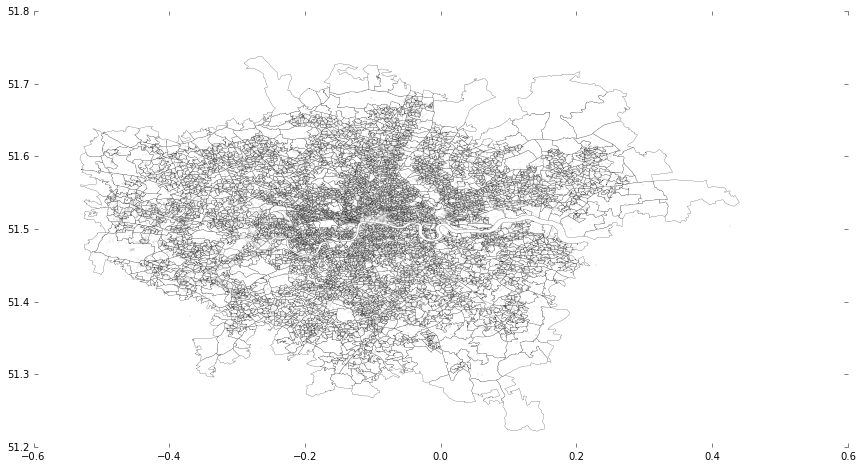

In [134]:
#for some reason getting multipolygons from the data
lsoas_london_temp = lsoas_london.apply(lambda row: row if type(row.geometry) is Polygon else None, axis=1)
lsoas_london_temp = lsoas_london_temp.dropna(subset=['LSOA11CD'])

plt.clf()
fig = plt.figure()
ax = fig.add_subplot(111, axisbg='w', frame_on=False)

# draw LSOAs with black outlines
patches = gpd.GeoSeries(
    lsoas_london_temp.geometry.map(lambda x: PolygonPatch(x, ec='#000000', lw=.2, alpha=1., zorder=9))
)
pc = PatchCollection(patches, match_original=True)
pc.set_facecolor('white')
ax.add_collection(pc)
ax.plot(*zip(*points), marker='o', color='r', ls='', markersize=0.1)

ax.autoscale() 

plt.tight_layout()
fig.set_size_inches(13, 7)
plt.savefig('points_in_LSOAs.png', dpi=1000, alpha=True)
plt.show()

In [135]:
romford = [51.5750992,0.1763523]

In [143]:
great_circle(romford, [50, 0]).km

The slowest run took 4.54 times longer than the fastest. This could mean that an intermediate result is being cached 
100000 loops, best of 3: 16.1 µs per loop


In [191]:
len(all_crimes)

45741